In [1]:
import pandas as pd

In [2]:
data = pd.read_csv("../data/fage-automne2021_merle-printemps2022/Supagro_28th-March-2022-15-2-36_COL23.csv",sep=';',header=1)

In [3]:
data.head()

,Date de relevé,Latitude,Longitude
0,1632385047,43.927765,3.1019266
1,1632385347,43.927135,3.1006334
2,1632385647,43.92686,3.1004417
3,1632385947,43.926933,3.1000817
4,1632386247,43.92711,3.1002367


<AxesSubplot:xlabel='Latitude', ylabel='Longitude'>

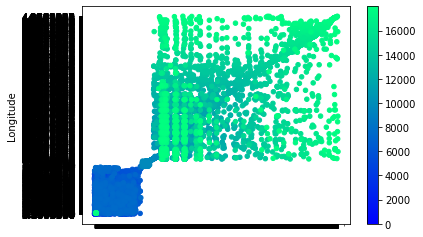

In [4]:
dh = data.head(18000)
dh.plot.scatter("Latitude","Longitude",c=dh.index,cmap='winter')

In [5]:
data = pd.read_csv("../data/fage-automne2021_merle-printemps2022/Supagro_28th-March-2022-15-14-27_COL14263.csv",sep=';',header=1)

<AxesSubplot:xlabel='Latitude', ylabel='Longitude'>

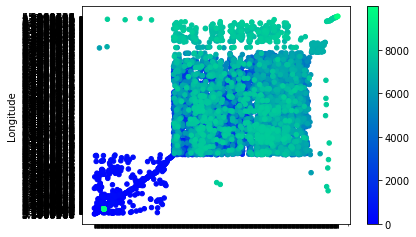

In [6]:
dh = data.head(10000)
dh.plot.scatter("Latitude","Longitude",c=dh.index,cmap='winter')

In [7]:
%pip install basemap

/usr/lib/python3/dist-packages/secretstorage/dhcrypto.py:15: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/usr/lib/python3/dist-packages/secretstorage/util.py:19: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [8]:
pd.to_datetime(dh['Date de relevé'].astype(int), unit="s")

0      2021-09-21 13:47:48
1      2021-09-21 13:52:48
2      2021-09-21 13:57:48
3      2021-09-21 14:02:48
4      2021-09-21 14:07:48
               ...        
9995   1970-01-06 00:00:41
9996   2022-02-21 08:49:06
9997   2022-02-21 08:54:06
9998   2022-02-21 15:35:23
9999   2022-02-21 15:40:23
Name: Date de relevé, Length: 10000, dtype: datetime64[ns]

In [9]:

#dh = data[(data["Latitude"] != "KO")]
dh = data[(data["Latitude"] != "KO") & data["Latitude"].str.startswith("43.9")]
#dh = data[(data["Latitude"] != "KO") & data["Latitude"].str.startswith("43.6")]

dh['Date'] = pd.to_datetime(dh['Date de relevé'].astype(int), unit="s")

#dh = dh[(dh['Date']>"2021-10-13 0:0:0")&(dh['Date']<"2021-10-13 23:59:59")]

lons = dh.Longitude.astype(float).tolist()
lats = dh.Latitude.astype(float).tolist()
color = (dh["Date de relevé"]-data["Date de relevé"][0]).tolist()
#color = (dh["Date de relevé"]).tolist()

/tmp/ipykernel_125567/3826462672.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dh['Date'] = pd.to_datetime(dh['Date de relevé'].astype(int), unit="s")


In [10]:
dh

,Date de relevé,Latitude,Longitude,Date
0,1632232068,43.93071,3.1008267,2021-09-21 13:47:48
1,1632232368,43.930725,3.1007566,2021-09-21 13:52:48
2,1632232668,43.9308,3.1006982,2021-09-21 13:57:48
3,1632232968,43.930836,3.1006882,2021-09-21 14:02:48
4,1632233268,43.931328,3.10021,2021-09-21 14:07:48
...,...,...,...,...
8077,1634655098,43.918297,3.09446,2021-10-19 14:51:38
8078,1634655398,43.91827,3.094495,2021-10-19 14:56:38
8079,1634655698,43.918285,3.0945168,2021-10-19 15:01:38
8080,1634655998,43.918053,3.09515,2021-10-19 15:06:38


In [11]:
lonMin = min(lons) - 0.001
lonMax = max(lons) + 0.001
latMin = min(lats) - 0.001
latMax = max(lats) + 0.001
print(lonMin,lonMax, latMin, latMax)

3.08876 3.1066917 43.916885 43.932786


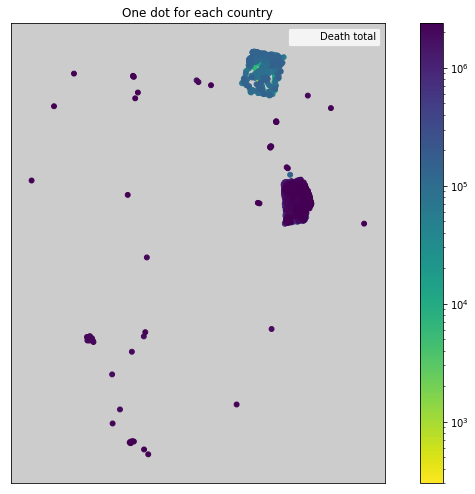

In [12]:
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import numpy as np


fig=plt.figure(figsize=(12,8))
ax=fig.add_axes([0.1,0.1,0.8,0.8])

#USING BASEMAP TO PLOT DATA :
# https://basemaptutorial.readthedocs.io/en/latest/first_map.html
# https://matplotlib.org/basemap/users/examples.html
# create new figure, axes instances.

# setup mercator map projection.
m = Basemap(projection='merc',llcrnrlat=latMin,urcrnrlat=latMax,\
            llcrnrlon=lonMin,urcrnrlon=lonMax,lat_ts=20,resolution='c')

# draw base map
m.drawcoastlines()
m.fillcontinents(zorder=0)
m.drawcountries()
m.drawparallels(np.arange(10,90,20),labels=[1,1,0,1])
m.drawmeridians(np.arange(-180,180,30),labels=[1,1,0,1])

# draw data on top
#lons = [df.iloc[i,2] for i in range(len(df))]
#lats = [df.iloc[i,1] for i in range(len(df))]
#color = [df["Total"][i] for i in range (len(df))]


# Convert the lat, lon to local projection
xpt, ypt = m(lons,lats)
#lonpt, latpt = m(x,y,inverse=True) # Fonction inverse

m.scatter(xpt,ypt,s=24,c=color,marker="o", cmap="viridis_r",norm=matplotlib.colors.LogNorm(),label='Death total')

#Choosing the colormap : https://matplotlib.org/stable/tutorials/colors/colormaps.html

ax.set_title('One dot for each country')
plt.legend()
plt.colorbar()

plt.show()

In [13]:
%pip install folium

/usr/lib/python3/dist-packages/secretstorage/dhcrypto.py:15: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/usr/lib/python3/dist-packages/secretstorage/util.py:19: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [14]:
dh.head()

,Date de relevé,Latitude,Longitude,Date
0,1632232068,43.93071,3.1008267,2021-09-21 13:47:48
1,1632232368,43.930725,3.1007566,2021-09-21 13:52:48
2,1632232668,43.9308,3.1006982,2021-09-21 13:57:48
3,1632232968,43.930836,3.1006882,2021-09-21 14:02:48
4,1632233268,43.931328,3.10021,2021-09-21 14:07:48


In [14]:
#http://www.xavierdupre.fr/app/papierstat/helpsphinx/notebooks/enedis_cartes2html.html
import folium
map_osm = folium.Map(location=[43.92, 3.09])

#for ind, lat, lon, com in df[['lat', 'long', 'Nom commune']][:50].itertuples():
#    map_osm.add_child(folium.RegularPolygonMarker(location=[lat,lon], popup=com,
#                       fill_color='#132b5e', radius=5))
for ind,color,lat,lon,date in dh.itertuples():
    map_osm.add_child(folium.RegularPolygonMarker(location=[lat,lon], popup=date,
                       fill_color='#132b5e', radius=5))

map_osm.fit_bounds([[latMin,lonMin], [latMax,lonMax]])
map_osm

In [133]:
#Geopandas ?
#https://towardsdatascience.com/geopandas-101-plot-any-data-with-a-latitude-and-longitude-on-a-map-98e01944b972

In [134]:
%pip install pycrs

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip available: 22.1.2 -> 22.2.2
[notice] To update, run: python.exe -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [135]:
import pycrs

fromcrs = pycrs.parse.from_epsg_code(4326) # WGS84 projection from epsg code
fromcrs_proj4 = fromcrs.to_proj4()

tocrs = pycrs.parse.from_epsg_code(2154) # Lambert93
tocrs_proj4 = tocrs.to_proj4()

import pyproj
fromproj = pyproj.Proj(fromcrs_proj4)
toproj = pyproj.Proj(tocrs_proj4)
x,y = pyproj.transform(fromproj, toproj, lons, lats)


C:\Users\agademer\AppData\Local\Temp\ipykernel_14968\1562074087.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  x,y = pyproj.transform(fromproj, toproj, lons, lats)


In [136]:
coord = pd.DataFrame(dh['Date'])
coord['x'] = x
coord['y'] = y
coord

,Date,x,y
7035,2021-10-16 00:01:47,708252.298261,6.314211e+06
7036,2021-10-16 00:06:47,708265.954132,6.314208e+06
7037,2021-10-16 00:11:47,708278.436275,6.314182e+06
7038,2021-10-16 00:16:47,708280.851942,6.314177e+06
7039,2021-10-16 00:21:47,708276.309126,6.314169e+06
...,...,...,...
7318,2021-10-16 23:36:45,708250.833377,6.314207e+06
7319,2021-10-16 23:41:45,708250.294438,6.314208e+06
7320,2021-10-16 23:46:45,708252.166074,6.314207e+06
7321,2021-10-16 23:51:45,708252.038013,6.314207e+06


In [137]:
movements_over_timesteps=(np.roll(coord, -1, axis=0)-coord)[:-1] # Calculating position differential
movements_over_timesteps

,Date,x,y
7035,0 days 00:05:00,13.655871,-2.537907
7036,0 days 00:05:00,12.482142,-26.20735
7037,0 days 00:05:00,2.415667,-4.885998
7038,0 days 00:05:00,-4.542816,-8.228596
7039,0 days 00:05:00,-4.147512,-3.450042
...,...,...,...
7317,0 days 00:05:00,1.60994,-2.88695
7318,0 days 00:05:00,-0.538938,0.666001
7319,0 days 00:05:00,1.871636,-0.330916
7320,0 days 00:05:00,-0.128061,-0.333518


In [138]:
speeds = pd.DataFrame({
        'Date': coord['Date'][:-1],
        'XYspeed': ((movements_over_timesteps.x ** 2+
        movements_over_timesteps.y ** 2)**(1/2))/movements_over_timesteps.Date.dt.total_seconds(),
    })
speeds

,Date,XYspeed
7035,2021-10-16 00:01:47,0.046299
7036,2021-10-16 00:06:47,0.09676
7037,2021-10-16 00:11:47,0.018168
7038,2021-10-16 00:16:47,0.031331
7039,2021-10-16 00:21:47,0.017983
...,...,...
7317,2021-10-16 23:31:45,0.011018
7318,2021-10-16 23:36:45,0.002856
7319,2021-10-16 23:41:45,0.006336
7320,2021-10-16 23:46:45,0.001191


<AxesSubplot:xlabel='Date'>

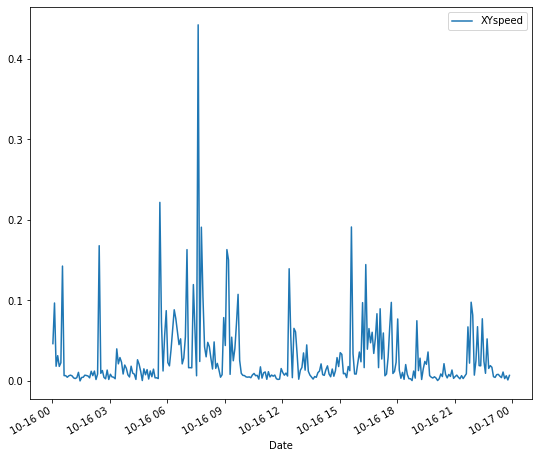

In [139]:
speeds.plot(x='Date',y='XYspeed',figsize=(9, 8))